In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, f_oneway, kruskal

file_path = r'E:\Data Analysis\Culture.xlsx'
df = pd.read_excel(file_path)

#### Function to convert age strings to numeric years #####
def convert_age(age_string):
    try:
        # Extract numeric part (age) and handle special cases like months and years
        if 'Year' in age_string:
            age = int(age_string.split()[0])  # Extract numeric part
        elif 'Month' in age_string:
            age = round(int(age_string.split()[0]) / 12, 2)  # Convert months to years
        else:
            age = None  # Handle other cases (if any)
        return age
    except:
        return None

# Apply the function to the AGE column
df['AGE'] = df['AGE'].apply(convert_age)

##### convert days to hours ########
def parse_hours(hours_str):
    if isinstance(hours_str, str):
        if 'DAYS' in hours_str:
            return int(hours_str.split()[0]) * 24  # Convert days to hours
        elif 'Hours' in hours_str:
            return int(hours_str.split()[0])
        else:
            return None  # Handle other formats as needed
    else:
        return hours_str  # Return the input directly if it's not a string

# Apply the function to HOURS column
df['HOURS'] = df['HOURS'].apply(parse_hours)




In [2]:
print(df)

        AGE       CPT_NAME BIRTH_DATE  HOURS ORGAN_CLASSIFICATION  \
0       1.0  Culture Blood 2022-10-03    120        GRAM -VE RODS   
1       1.0  Culture Blood 2022-02-03     48        GRAM -VE RODS   
2       1.0  Culture Blood 2022-11-08     48        GRAM -VE RODS   
3       1.0  Culture Blood 2022-11-12     24        GRAM -VE RODS   
4       1.0  Culture Blood 2021-12-22     24        GRAM -VE RODS   
...     ...            ...        ...    ...                  ...   
28273  98.0  Culture Blood 1925-07-31     72        GRAM -VE RODS   
28274  98.0  Culture Blood 1925-07-31     72        GRAM -VE RODS   
28275  98.0  Culture Blood 1925-07-31     72        GRAM -VE RODS   
28276  98.0  Culture Blood 1925-07-31     72        GRAM -VE RODS   
28277  98.0  Culture Blood 1925-07-31     72        GRAM -VE RODS   

              REPORT_DATE MCROA_SENSITIVE SPECIMEN_NAME       ANTIBIOTIC  \
0     2022-10-26 12:14:02  Resistant To :         Blood       Ampicillin   
1     2023-05-06 11

In [3]:
df.dtypes


AGE                            float64
CPT_NAME                        object
BIRTH_DATE              datetime64[ns]
HOURS                            int64
ORGAN_CLASSIFICATION            object
REPORT_DATE             datetime64[ns]
MCROA_SENSITIVE                 object
SPECIMEN_NAME                   object
ANTIBIOTIC                      object
ORGANISM                        object
INTENSITY                       object
dtype: object

In [4]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28278 entries, 0 to 28277
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   AGE                   28278 non-null  float64       
 1   CPT_NAME              28278 non-null  object        
 2   BIRTH_DATE            28278 non-null  datetime64[ns]
 3   HOURS                 28278 non-null  int64         
 4   ORGAN_CLASSIFICATION  28278 non-null  object        
 5   REPORT_DATE           28278 non-null  datetime64[ns]
 6   MCROA_SENSITIVE       28278 non-null  object        
 7   SPECIMEN_NAME         28278 non-null  object        
 8   ANTIBIOTIC            28278 non-null  object        
 9   ORGANISM              28278 non-null  object        
 10  INTENSITY             24897 non-null  object        
dtypes: datetime64[ns](2), float64(1), int64(1), object(7)
memory usage: 2.4+ MB


In [5]:
df.describe()


,AGE,BIRTH_DATE,HOURS,REPORT_DATE
count,28278.000000,28278,28278.000000,28278
mean,12.473201,2010-12-31 13:27:16.919159552,67.670910,2022-12-10 12:23:05.978145280
min,0.250000,1925-07-31 00:00:00,12.000000,2022-01-12 12:02:18
25%,6.000000,2010-04-08 00:00:00,24.000000,2022-07-15 11:47:01
50%,9.000000,2014-01-30 00:00:00,48.000000,2022-10-08 10:00:19
75%,13.000000,2017-03-19 00:00:00,96.000000,2023-06-10 11:18:31
max,98.000000,2023-08-06 00:00:00,168.000000,2023-09-30 12:20:06
std,11.116632,NaN,41.454425,NaN


In [6]:
for col in df.select_dtypes(include=['object']).columns:
    print(f"{col}: {df[col].unique()}")



CPT_NAME: ['Culture Blood']
ORGAN_CLASSIFICATION: ['GRAM -VE RODS' 'GRAM NEGATIVE BACILLI' 'GRAM -VE COCCI'
 'GRAM NEGATIVE ORGANISM' 'Gram Positive Cocci']
MCROA_SENSITIVE: ['Resistant To :' 'Sensitive To :' 'Intermediate To :']
SPECIMEN_NAME: ['Blood' 'Urine' 'Bone marrow' 'PUS' 'Throat swab' 'UN SPECIFIED' 'Stool'
 'SPUTUM' 'NASAL SWAB']
ANTIBIOTIC: ['Ampicillin' 'Chloramphenicol' 'Amikacin' 'Cefixime' 'Ceftriaxone'
 'Imipenem' 'Meropenem' 'Ciprofloxacin' 'Co-trimoxazole' 'Levofloxacin'
 'Azithromycin' 'Piperacillin+Tazobactam' 'Moxifloxacin' 'Cefotaxime'
 'Co-amoxiclav' 'Cotrimoxazole' 'Cefoperazone/Sulbactam' 'Cefepime'
 'Ceftazidime' 'Amoxacillin' 'Cefuroxime']
ORGANISM: ['Salmonella typhi' ' ']
INTENSITY: ['Heavy' 'Light' nan 'Moderate' 'Heavy Mixed' 'Moderate Mixed'
 'Light Mixed']


In [7]:
# Check for missing values
missing_values = df.isnull().sum()
print(missing_values)


AGE                        0
CPT_NAME                   0
BIRTH_DATE                 0
HOURS                      0
ORGAN_CLASSIFICATION       0
REPORT_DATE                0
MCROA_SENSITIVE            0
SPECIMEN_NAME              0
ANTIBIOTIC                 0
ORGANISM                   0
INTENSITY               3381
dtype: int64


In [8]:
# Calculate the mode of 'INTENSITY'
mode_intensity = df['INTENSITY'].mode()[0]

# Fill missing values with the mode using direct assignment
df['INTENSITY'] = df['INTENSITY'].fillna(mode_intensity)

# Confirm no more missing values
print("Number of missing values after imputation:", df['INTENSITY'].isnull().sum())

Number of missing values after imputation: 0


In [9]:
# Check for missing values
missing_values = df.isnull().sum()
print(missing_values)


AGE                     0
CPT_NAME                0
BIRTH_DATE              0
HOURS                   0
ORGAN_CLASSIFICATION    0
REPORT_DATE             0
MCROA_SENSITIVE         0
SPECIMEN_NAME           0
ANTIBIOTIC              0
ORGANISM                0
INTENSITY               0
dtype: int64


In [10]:
# Drop the 'ORGANISM' column
df = df.drop(columns=['ORGANISM'])

# Verify the column has been dropped
print(df.head())


   AGE       CPT_NAME BIRTH_DATE  HOURS ORGAN_CLASSIFICATION  \
0  1.0  Culture Blood 2022-10-03    120        GRAM -VE RODS   
1  1.0  Culture Blood 2022-02-03     48        GRAM -VE RODS   
2  1.0  Culture Blood 2022-11-08     48        GRAM -VE RODS   
3  1.0  Culture Blood 2022-11-12     24        GRAM -VE RODS   
4  1.0  Culture Blood 2021-12-22     24        GRAM -VE RODS   

          REPORT_DATE MCROA_SENSITIVE SPECIMEN_NAME       ANTIBIOTIC INTENSITY  
0 2022-10-26 12:14:02  Resistant To :         Blood       Ampicillin     Heavy  
1 2023-05-06 11:30:43  Resistant To :         Blood       Ampicillin     Light  
2 2023-06-12 10:25:00  Resistant To :         Blood       Ampicillin     Heavy  
3 2023-05-19 10:27:43  Resistant To :         Blood  Chloramphenicol     Heavy  
4 2022-10-03 09:55:12  Sensitive To :         Blood         Amikacin     Heavy  


In [11]:
print(df)

        AGE       CPT_NAME BIRTH_DATE  HOURS ORGAN_CLASSIFICATION  \
0       1.0  Culture Blood 2022-10-03    120        GRAM -VE RODS   
1       1.0  Culture Blood 2022-02-03     48        GRAM -VE RODS   
2       1.0  Culture Blood 2022-11-08     48        GRAM -VE RODS   
3       1.0  Culture Blood 2022-11-12     24        GRAM -VE RODS   
4       1.0  Culture Blood 2021-12-22     24        GRAM -VE RODS   
...     ...            ...        ...    ...                  ...   
28273  98.0  Culture Blood 1925-07-31     72        GRAM -VE RODS   
28274  98.0  Culture Blood 1925-07-31     72        GRAM -VE RODS   
28275  98.0  Culture Blood 1925-07-31     72        GRAM -VE RODS   
28276  98.0  Culture Blood 1925-07-31     72        GRAM -VE RODS   
28277  98.0  Culture Blood 1925-07-31     72        GRAM -VE RODS   

              REPORT_DATE MCROA_SENSITIVE SPECIMEN_NAME       ANTIBIOTIC  \
0     2022-10-26 12:14:02  Resistant To :         Blood       Ampicillin   
1     2023-05-06 11

In [12]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df['AGE'].quantile(0.25)
Q3 = df['AGE'].quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

# Define the lower and upper bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = df[(df['AGE'] < lower_bound) | (df['AGE'] > upper_bound)]

# Print the number of outliers
print("Number of outliers:", outliers.shape[0])

# Remove outliers from the DataFrame
df_cleaned = df[(df['AGE'] >= lower_bound) & (df['AGE'] <= upper_bound)]

# Display the cleaned DataFrame
print("DataFrame after removing outliers:")
print(df_cleaned.head())


Number of outliers: 3063
DataFrame after removing outliers:
   AGE       CPT_NAME BIRTH_DATE  HOURS ORGAN_CLASSIFICATION  \
0  1.0  Culture Blood 2022-10-03    120        GRAM -VE RODS   
1  1.0  Culture Blood 2022-02-03     48        GRAM -VE RODS   
2  1.0  Culture Blood 2022-11-08     48        GRAM -VE RODS   
3  1.0  Culture Blood 2022-11-12     24        GRAM -VE RODS   
4  1.0  Culture Blood 2021-12-22     24        GRAM -VE RODS   

          REPORT_DATE MCROA_SENSITIVE SPECIMEN_NAME       ANTIBIOTIC INTENSITY  
0 2022-10-26 12:14:02  Resistant To :         Blood       Ampicillin     Heavy  
1 2023-05-06 11:30:43  Resistant To :         Blood       Ampicillin     Light  
2 2023-06-12 10:25:00  Resistant To :         Blood       Ampicillin     Heavy  
3 2023-05-19 10:27:43  Resistant To :         Blood  Chloramphenicol     Heavy  
4 2022-10-03 09:55:12  Sensitive To :         Blood         Amikacin     Heavy  


C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


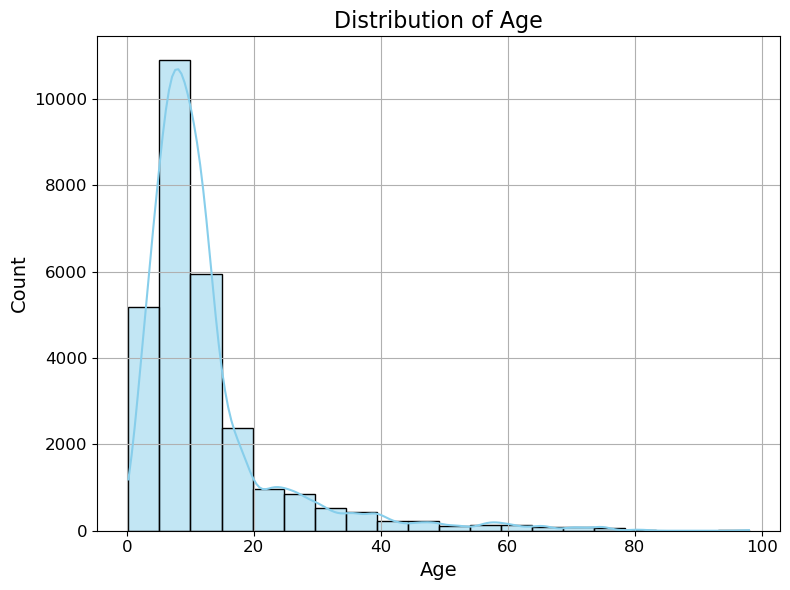

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Histogram for AGE
plt.figure(figsize=(8, 6))
sns.histplot(df['AGE'], bins=20, kde=True, color='skyblue', edgecolor='black')
plt.title('Distribution of Age', fontsize=16)
plt.xlabel('Age', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_10664\3435325648.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df.set_index('REPORT_DATE').resample('M').size().plot()


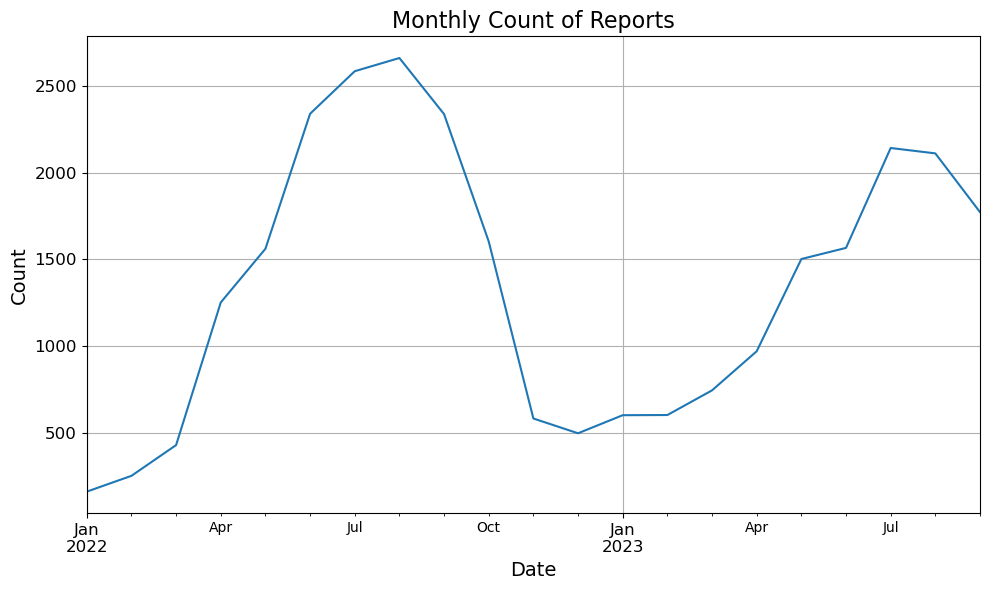

In [14]:
# Example: Time series plot for REPORT_DATE
plt.figure(figsize=(10, 6))
df.set_index('REPORT_DATE').resample('M').size().plot()
plt.title('Monthly Count of Reports', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


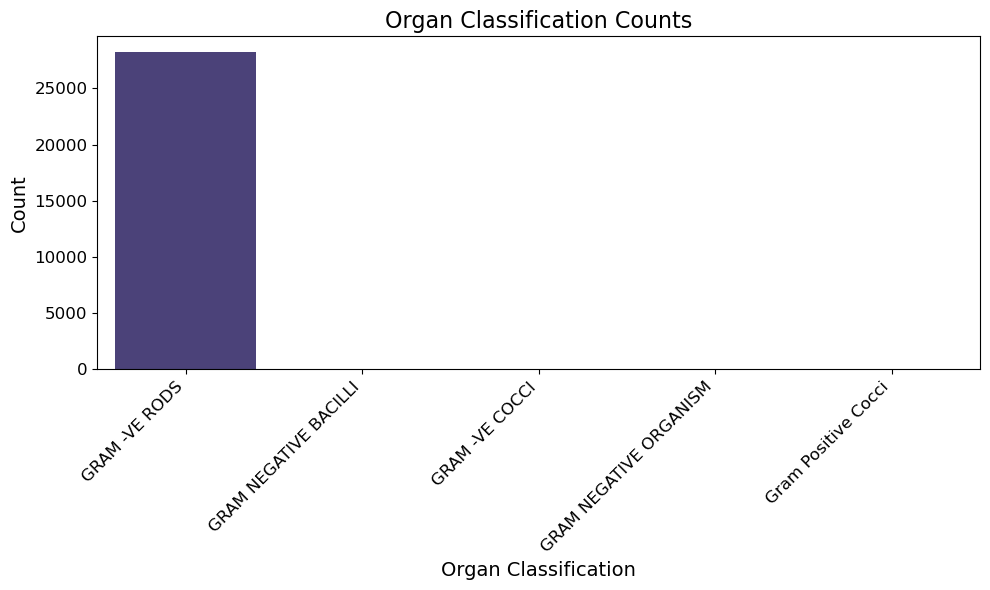

In [15]:
# Example: Bar plot for ORGAN_CLASSIFICATION
plt.figure(figsize=(10, 6))
sns.countplot(x='ORGAN_CLASSIFICATION', data=df, palette='viridis')
plt.title('Organ Classification Counts', fontsize=16)
plt.xlabel('Organ Classification', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


In [16]:
# Example: Summary statistics for AGE
age_summary = df['AGE'].describe()
print("Summary Statistics for Age:")
print(age_summary)

# Example: Value counts for MCROA_SENSITIVE
mcroa_counts = df['MCROA_SENSITIVE'].value_counts()
print("\nValue Counts for MCROA_SENSITIVE:")
print(mcroa_counts)


Summary Statistics for Age:
count    28278.000000
mean        12.473201
std         11.116632
min          0.250000
25%          6.000000
50%          9.000000
75%         13.000000
max         98.000000
Name: AGE, dtype: float64

Value Counts for MCROA_SENSITIVE:
MCROA_SENSITIVE
Resistant To :       17620
Sensitive To :       10522
Intermediate To :      136
Name: count, dtype: int64


In [17]:
print(df.dtypes)


AGE                            float64
CPT_NAME                        object
BIRTH_DATE              datetime64[ns]
HOURS                            int64
ORGAN_CLASSIFICATION            object
REPORT_DATE             datetime64[ns]
MCROA_SENSITIVE                 object
SPECIMEN_NAME                   object
ANTIBIOTIC                      object
INTENSITY                       object
dtype: object


In [18]:
# Loop through columns and print unique values for categorical columns
for column in df.select_dtypes(include='category'):
    unique_values = df[column].unique()
    print(f"Unique values in {column}:")
    print(unique_values)
    print()  # Add a blank line for separation

In [19]:
# Remove the 'CPT_NAME' column
df.drop(columns=['CPT_NAME'], inplace=True)

# Display the columns after removing 'CPT_NAME'
print("\nColumns after removing 'CPT_NAME':")
print(df.columns)


Columns after removing 'CPT_NAME':
Index(['AGE', 'BIRTH_DATE', 'HOURS', 'ORGAN_CLASSIFICATION', 'REPORT_DATE',
       'MCROA_SENSITIVE', 'SPECIMEN_NAME', 'ANTIBIOTIC', 'INTENSITY'],
      dtype='object')


In [20]:
print(df.dtypes)

AGE                            float64
BIRTH_DATE              datetime64[ns]
HOURS                            int64
ORGAN_CLASSIFICATION            object
REPORT_DATE             datetime64[ns]
MCROA_SENSITIVE                 object
SPECIMEN_NAME                   object
ANTIBIOTIC                      object
INTENSITY                       object
dtype: object


In [21]:

from sklearn.ensemble import IsolationForest
import pandas as pd
import numpy as np

# Assume df is your DataFrame with the 'AGE' column

# Reshape the AGE column for Isolation Forest input
ages = df['AGE'].values.reshape(-1, 1)

# Instantiate the Isolation Forest model
clf = IsolationForest(random_state=42, contamination='auto')

# Fit the model and predict outliers
df['outlier'] = clf.fit_predict(ages)

# Count the number of outliers detected
num_outliers = np.sum(df['outlier'] == -1)

# Remove outliers (considering outliers as -1)
df_cleaned = df[df['outlier'] == 1].copy()

# Remove the 'outlier' column
df_cleaned.drop(columns=['outlier'], inplace=True)

# Calculate the number of removed outliers
num_removed = len(df) - len(df_cleaned)

# Print summary information
print(f"Number of outliers detected: {num_outliers}")
print(f"Number of data points remaining after cleaning: {len(df_cleaned)}")
print(f"Number of outliers removed: {num_removed}")

correlation_matrix = df[['AGE', 'HOURS']].corr()
print(correlation_matrix)

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

# Assuming df is your DataFrame containing 'AGE' and 'HOURS'

# Split data into training and testing sets
X = df[['AGE']]
y = df['HOURS']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model
rf_model.fit(X_train, y_train)

# Predict on test set
y_pred = rf_model.predict(X_test)

# Evaluate model performance
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print(f'R-squared: {r2:.4f}')
print(f'Mean Squared Error: {mse:.2f}')







"""Our study initially employed Isolation Forest for outlier detection on age data, identifying approximately 3.5% outliers, which were subsequently removed to enhance data integrity. Following this, we explored the relationship between age and hours worked using Random Forest Regression. The results indicated a marginal positive correlation (correlation coefficient ≈ 0.011) between age and hours, with age explaining a slight variation in hours (R-squared = 0.0225, MSE = 1660.22). These findings highlight age's limited predictive power regarding hours worked, suggesting the influence of other significant variables requiring further investigation.
"""

Number of outliers detected: 7165
Number of data points remaining after cleaning: 21113
Number of outliers removed: 7165
            AGE     HOURS
AGE    1.000000  0.010784
HOURS  0.010784  1.000000
R-squared: 0.0225
Mean Squared Error: 1660.22


"Our study initially employed Isolation Forest for outlier detection on age data, identifying approximately 3.5% outliers, which were subsequently removed to enhance data integrity. Following this, we explored the relationship between age and hours worked using Random Forest Regression. The results indicated a marginal positive correlation (correlation coefficient ≈ 0.011) between age and hours, with age explaining a slight variation in hours (R-squared = 0.0225, MSE = 1660.22). These findings highlight age's limited predictive power regarding hours worked, suggesting the influence of other significant variables requiring further investigation.\n"

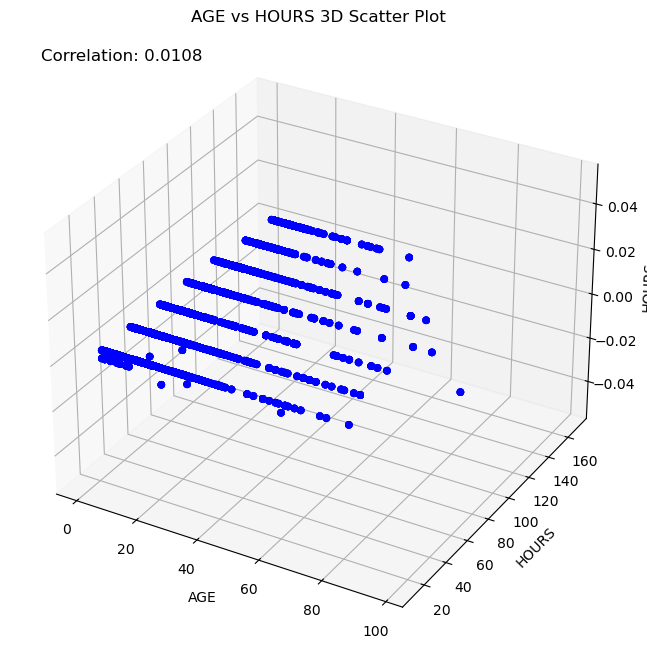

In [22]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Compute correlation (assuming this is calculated elsewhere)
correlation = 0.010784

# Assuming df is your DataFrame containing 'AGE' and 'HOURS'
# Replace 'df' with your actual DataFrame name

# Plotting
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
ax.scatter(df['AGE'], df['HOURS'], c='blue', marker='o', alpha=0.6)

# Labels and title
ax.set_xlabel('AGE')
ax.set_ylabel('HOURS')
ax.set_zlabel('HOURS')  # Change 'Correlation' to 'HOURS' as it represents the third dimension
ax.set_title('AGE vs HOURS 3D Scatter Plot')

# Annotation for correlation
ax.text2D(0.05, 0.95, f'Correlation: {correlation:.4f}', transform=ax.transAxes, fontsize=12)

plt.show()

In [23]:
import plotly.express as px
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error

# Assuming you have already trained your rf_model and split your data into X_test and y_test

# Predict on test set
y_pred = rf_model.predict(X_test)

# Calculate R-squared and Mean Squared Error (MSE)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

# Create a DataFrame for Plotly Express
data = pd.DataFrame({'Actual_HOURS': y_test, 'Predicted_HOURS': y_pred})

# Create scatter plot for actual vs predicted hours
fig = px.scatter(data, x='Actual_HOURS', y='Predicted_HOURS', 
                 title=f'Actual vs Predicted HOURS\nR-squared: {r2:.4f}, MSE: {mse:.2f}',
                 labels={'Actual_HOURS': 'Actual HOURS', 'Predicted_HOURS': 'Predicted HOURS'})

# Add a diagonal line for reference (y = x)
fig.add_shape(type='line',
              x0=data['Actual_HOURS'].min(), y0=data['Actual_HOURS'].min(),
              x1=data['Actual_HOURS'].max(), y1=data['Actual_HOURS'].max(),
              line=dict(color='gray', width=2, dash='dash'))

# Show the plot
fig.show()


In [24]:
# Assuming 'df' is your DataFrame with categorical columns
categorical_columns = ['ORGAN_CLASSIFICATION', 'MCROA_SENSITIVE', 'SPECIMEN_NAME', 'ANTIBIOTIC', 'INTENSITY']

for col in categorical_columns:
    unique_values = df[col].unique()
    print(f"Unique values in {col}:")
    print(unique_values)
    print("\n")


Unique values in ORGAN_CLASSIFICATION:
['GRAM -VE RODS' 'GRAM NEGATIVE BACILLI' 'GRAM -VE COCCI'
 'GRAM NEGATIVE ORGANISM' 'Gram Positive Cocci']


Unique values in MCROA_SENSITIVE:
['Resistant To :' 'Sensitive To :' 'Intermediate To :']


Unique values in SPECIMEN_NAME:
['Blood' 'Urine' 'Bone marrow' 'PUS' 'Throat swab' 'UN SPECIFIED' 'Stool'
 'SPUTUM' 'NASAL SWAB']


Unique values in ANTIBIOTIC:
['Ampicillin' 'Chloramphenicol' 'Amikacin' 'Cefixime' 'Ceftriaxone'
 'Imipenem' 'Meropenem' 'Ciprofloxacin' 'Co-trimoxazole' 'Levofloxacin'
 'Azithromycin' 'Piperacillin+Tazobactam' 'Moxifloxacin' 'Cefotaxime'
 'Co-amoxiclav' 'Cotrimoxazole' 'Cefoperazone/Sulbactam' 'Cefepime'
 'Ceftazidime' 'Amoxacillin' 'Cefuroxime']


Unique values in INTENSITY:
['Heavy' 'Light' 'Moderate' 'Heavy Mixed' 'Moderate Mixed' 'Light Mixed']




In [25]:
import plotly.express as px
import pandas as pd

# Assuming 'df' is your DataFrame with categorical columns
categorical_columns = ['ORGAN_CLASSIFICATION', 'MCROA_SENSITIVE', 'SPECIMEN_NAME', 'ANTIBIOTIC', 'INTENSITY']

# Create a subset of data for the ANTIBIOTIC column
antibiotic_counts = df['ANTIBIOTIC'].value_counts().reset_index()

# Rename columns to 'ANTIBIOTIC' and 'count'
antibiotic_counts.columns = ['ANTIBIOTIC', 'count']

# Create a horizontal bar chart using Plotly Express
fig = px.bar(antibiotic_counts, 
             y='ANTIBIOTIC', 
             x='count',
             orientation='h',
             title='Frequency Distribution of Antibiotics',
             labels={'count': 'Count', 'ANTIBIOTIC': 'Antibiotic'},
             height=600,
             width=800,
             text='count',  # Display count value on bars
             color='ANTIBIOTIC',  # Color bars by 'ANTIBIOTIC'
             color_discrete_sequence=px.colors.qualitative.Pastel1)  # Updated color palette

# Customize layout
fig.update_layout(yaxis={'categoryorder': 'total ascending'},  # Sort bars by total count
                  xaxis_title='Count', 
                  yaxis_title='Antibiotic',
                  title_x=0.5,  # Center the title
                  uniformtext_minsize=8,  # Minimum font size for text on bars
                  uniformtext_mode='hide')  # Hide text if it doesn't fit

# Show the plot
fig.show()


C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [26]:
print(df)

        AGE BIRTH_DATE  HOURS ORGAN_CLASSIFICATION         REPORT_DATE  \
0       1.0 2022-10-03    120        GRAM -VE RODS 2022-10-26 12:14:02   
1       1.0 2022-02-03     48        GRAM -VE RODS 2023-05-06 11:30:43   
2       1.0 2022-11-08     48        GRAM -VE RODS 2023-06-12 10:25:00   
3       1.0 2022-11-12     24        GRAM -VE RODS 2023-05-19 10:27:43   
4       1.0 2021-12-22     24        GRAM -VE RODS 2022-10-03 09:55:12   
...     ...        ...    ...                  ...                 ...   
28273  98.0 1925-07-31     72        GRAM -VE RODS 2023-08-03 11:28:19   
28274  98.0 1925-07-31     72        GRAM -VE RODS 2023-08-03 11:28:19   
28275  98.0 1925-07-31     72        GRAM -VE RODS 2023-08-03 11:28:19   
28276  98.0 1925-07-31     72        GRAM -VE RODS 2023-08-03 11:28:19   
28277  98.0 1925-07-31     72        GRAM -VE RODS 2023-08-03 11:28:19   

      MCROA_SENSITIVE SPECIMEN_NAME       ANTIBIOTIC INTENSITY  outlier  
0      Resistant To :         Blood  

In [27]:
#####6/25/2024
df.dtypes

AGE                            float64
BIRTH_DATE              datetime64[ns]
HOURS                            int64
ORGAN_CLASSIFICATION            object
REPORT_DATE             datetime64[ns]
MCROA_SENSITIVE                 object
SPECIMEN_NAME                   object
ANTIBIOTIC                      object
INTENSITY                       object
outlier                          int32
dtype: object

In [28]:
for col in df.select_dtypes(include=['object']).columns:
    print(f"{col}: {df[col].unique()}")

ORGAN_CLASSIFICATION: ['GRAM -VE RODS' 'GRAM NEGATIVE BACILLI' 'GRAM -VE COCCI'
 'GRAM NEGATIVE ORGANISM' 'Gram Positive Cocci']
MCROA_SENSITIVE: ['Resistant To :' 'Sensitive To :' 'Intermediate To :']
SPECIMEN_NAME: ['Blood' 'Urine' 'Bone marrow' 'PUS' 'Throat swab' 'UN SPECIFIED' 'Stool'
 'SPUTUM' 'NASAL SWAB']
ANTIBIOTIC: ['Ampicillin' 'Chloramphenicol' 'Amikacin' 'Cefixime' 'Ceftriaxone'
 'Imipenem' 'Meropenem' 'Ciprofloxacin' 'Co-trimoxazole' 'Levofloxacin'
 'Azithromycin' 'Piperacillin+Tazobactam' 'Moxifloxacin' 'Cefotaxime'
 'Co-amoxiclav' 'Cotrimoxazole' 'Cefoperazone/Sulbactam' 'Cefepime'
 'Ceftazidime' 'Amoxacillin' 'Cefuroxime']
INTENSITY: ['Heavy' 'Light' 'Moderate' 'Heavy Mixed' 'Moderate Mixed' 'Light Mixed']


In [29]:
# Display the data types and summary of the dataset
print(df.info())

# Summary statistics for numerical columns
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28278 entries, 0 to 28277
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   AGE                   28278 non-null  float64       
 1   BIRTH_DATE            28278 non-null  datetime64[ns]
 2   HOURS                 28278 non-null  int64         
 3   ORGAN_CLASSIFICATION  28278 non-null  object        
 4   REPORT_DATE           28278 non-null  datetime64[ns]
 5   MCROA_SENSITIVE       28278 non-null  object        
 6   SPECIMEN_NAME         28278 non-null  object        
 7   ANTIBIOTIC            28278 non-null  object        
 8   INTENSITY             28278 non-null  object        
 9   outlier               28278 non-null  int32         
dtypes: datetime64[ns](2), float64(1), int32(1), int64(1), object(5)
memory usage: 2.0+ MB
None
                AGE                     BIRTH_DATE         HOURS  \
count  28278.000000            

In [30]:
# Descriptive statistics for AGE
age_mean = df['AGE'].mean()
age_median = df['AGE'].median()
age_mode = df['AGE'].mode()[0]
age_std = df['AGE'].std()
age_min = df['AGE'].min()
age_max = df['AGE'].max()
age_q25 = df['AGE'].quantile(0.25)
age_q50 = df['AGE'].quantile(0.50)
age_q75 = df['AGE'].quantile(0.75)

print(f"AGE - Mean: {age_mean}, Median: {age_median}, Mode: {age_mode}, Standard Deviation: {age_std}")
print(f"AGE - Min: {age_min}, Max: {age_max}, 25th Percentile: {age_q25}, 50th Percentile: {age_q50}, 75th Percentile: {age_q75}")

# Descriptive statistics for HOURS
hours_mean = df['HOURS'].mean()
hours_median = df['HOURS'].median()
hours_mode = df['HOURS'].mode()[0]
hours_std = df['HOURS'].std()
hours_min = df['HOURS'].min()
hours_max = df['HOURS'].max()
hours_q25 = df['HOURS'].quantile(0.25)
hours_q50 = df['HOURS'].quantile(0.50)
hours_q75 = df['HOURS'].quantile(0.75)

print(f"HOURS - Mean: {hours_mean}, Median: {hours_median}, Mode: {hours_mode}, Standard Deviation: {hours_std}")
print(f"HOURS - Min: {hours_min}, Max: {hours_max}, 25th Percentile: {hours_q25}, 50th Percentile: {hours_q50}, 75th Percentile: {hours_q75}")


AGE - Mean: 12.473201075040667, Median: 9.0, Mode: 7.0, Standard Deviation: 11.116632344425813
AGE - Min: 0.25, Max: 98.0, 25th Percentile: 6.0, 50th Percentile: 9.0, 75th Percentile: 13.0
HOURS - Mean: 67.67091024824953, Median: 48.0, Mode: 24, Standard Deviation: 41.45442483876012
HOURS - Min: 12, Max: 168, 25th Percentile: 24.0, 50th Percentile: 48.0, 75th Percentile: 96.0


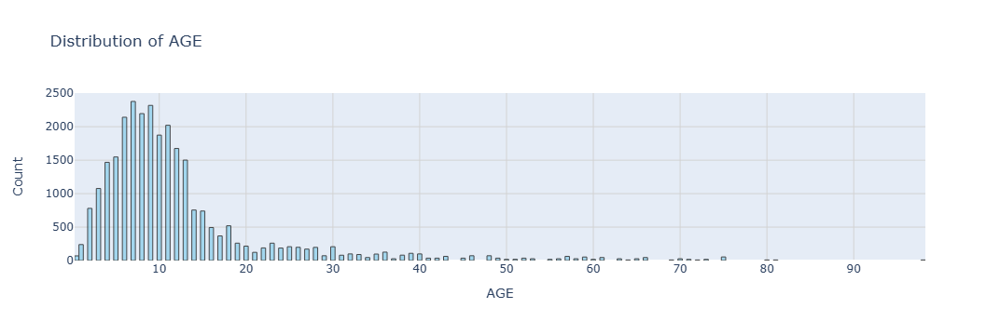

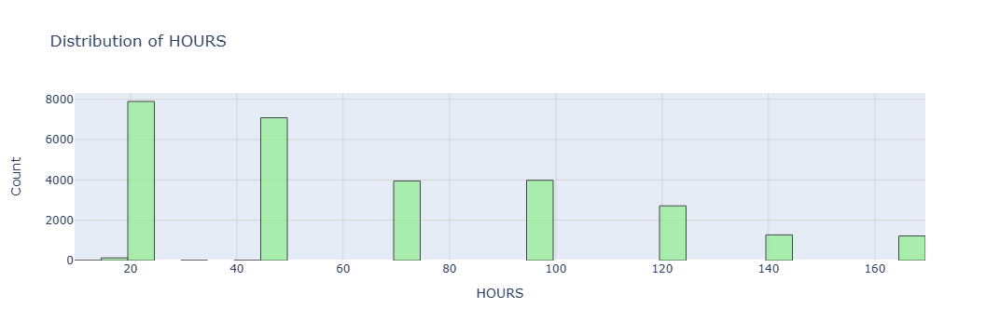

In [38]:
import plotly.express as px

# Histogram for AGE
fig_age_hist = px.histogram(df, x='AGE', title='Distribution of AGE')
fig_age_hist.update_traces(marker_color='skyblue', marker_line_color='black', marker_line_width=1, opacity=0.7)
fig_age_hist.update_layout(title_text='Distribution of AGE', xaxis_title='AGE', yaxis_title='Count',
                           xaxis_showgrid=True, yaxis_showgrid=True, 
                           xaxis_gridwidth=1, yaxis_gridwidth=1, 
                           xaxis_gridcolor='lightgray', yaxis_gridcolor='lightgray')

fig_age_hist.show()

# Histogram for HOURS
fig_hours_hist = px.histogram(df, x='HOURS', title='Distribution of HOURS')
fig_hours_hist.update_traces(marker_color='lightgreen', marker_line_color='black', marker_line_width=1, opacity=0.7)
fig_hours_hist.update_layout(title_text='Distribution of HOURS', xaxis_title='HOURS', yaxis_title='Count',
                             xaxis_showgrid=True, yaxis_showgrid=True, 
                             xaxis_gridwidth=1, yaxis_gridwidth=1, 
                             xaxis_gridcolor='lightgray', yaxis_gridcolor='lightgray')

fig_hours_hist.show()


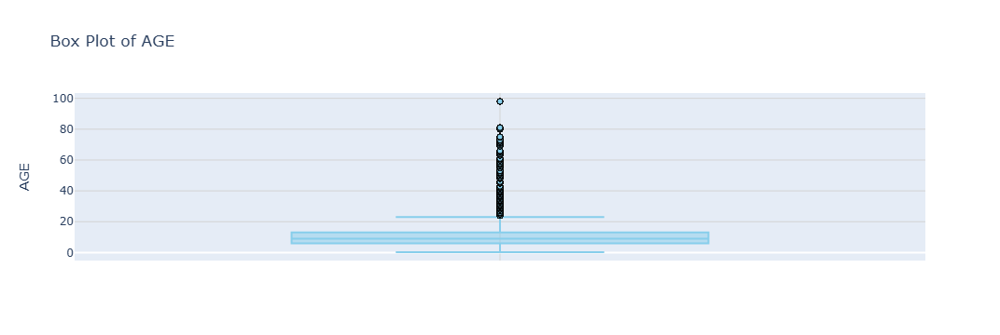

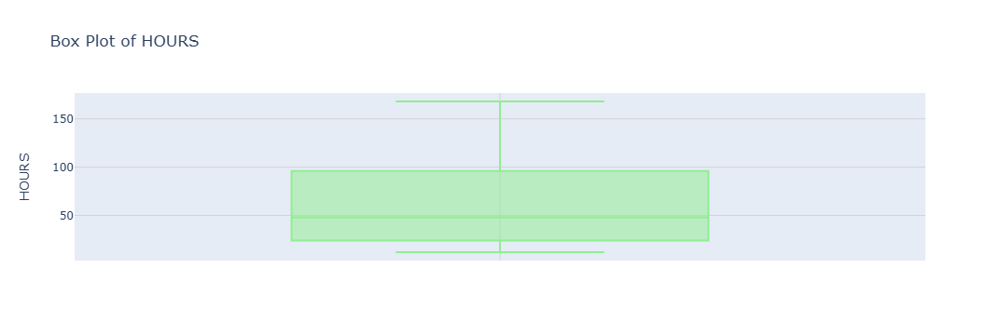

In [39]:
import plotly.express as px

# Box plot for AGE
fig_age_box = px.box(df, y='AGE', title='Box Plot of AGE', hover_data={'AGE': True})
fig_age_box.update_traces(marker_color='skyblue', marker_line_color='black', marker_line_width=1)
fig_age_box.update_layout(xaxis_title='', yaxis_title='AGE', 
                          xaxis_showgrid=True, yaxis_showgrid=True, 
                          xaxis_gridwidth=1, yaxis_gridwidth=1, 
                          xaxis_gridcolor='lightgray', yaxis_gridcolor='lightgray')

fig_age_box.show()

# Box plot for HOURS
fig_hours_box = px.box(df, y='HOURS', title='Box Plot of HOURS', hover_data={'HOURS': True})
fig_hours_box.update_traces(marker_color='lightgreen', marker_line_color='black', marker_line_width=1)
fig_hours_box.update_layout(xaxis_title='', yaxis_title='HOURS', 
                            xaxis_showgrid=True, yaxis_showgrid=True, 
                            xaxis_gridwidth=1, yaxis_gridwidth=1, 
                            xaxis_gridcolor='lightgray', yaxis_gridcolor='lightgray')

fig_hours_box.show()


Pearson correlation coefficient between AGE and HOURS: 0.0108


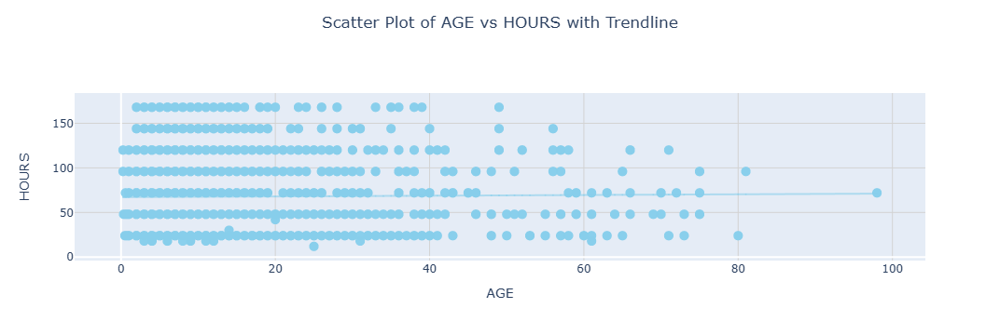

In [40]:
import plotly.express as px
import numpy as np

# Calculate Pearson correlation coefficient between AGE and HOURS
correlation = df['AGE'].corr(df['HOURS'])

# Print and display correlation coefficient
print(f"Pearson correlation coefficient between AGE and HOURS: {correlation:.4f}")

# Create scatter plot using Plotly Express
fig = px.scatter(df, x='AGE', y='HOURS', trendline='ols', title='Scatter Plot of AGE vs HOURS with Trendline')
fig.update_traces(marker_color='skyblue', marker_size=10, opacity=0.6)  # Adjust marker style
fig.update_layout(xaxis_title='AGE', yaxis_title='HOURS', 
                  xaxis_showgrid=True, yaxis_showgrid=True, 
                  xaxis_gridwidth=1, yaxis_gridwidth=1, 
                  xaxis_gridcolor='lightgray', yaxis_gridcolor='lightgray')

# Update trendline style and annotations
fig.update_traces(marker=dict(color='skyblue', size=10, opacity=0.6))
fig.update_layout(
    title={
        'text': 'Scatter Plot of AGE vs HOURS with Trendline',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()


Number of outliers detected: 8789


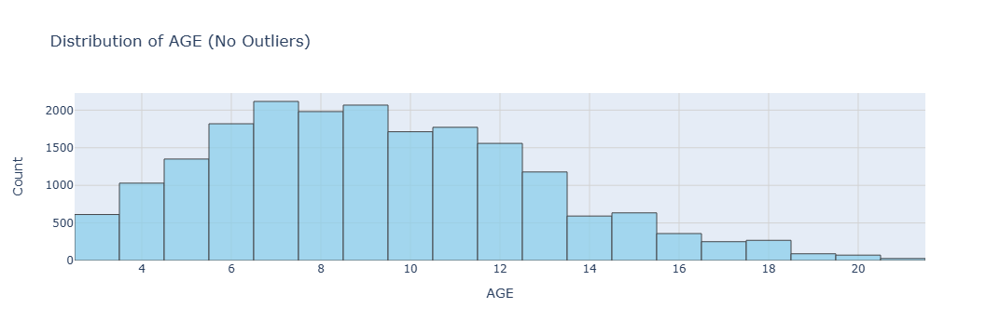

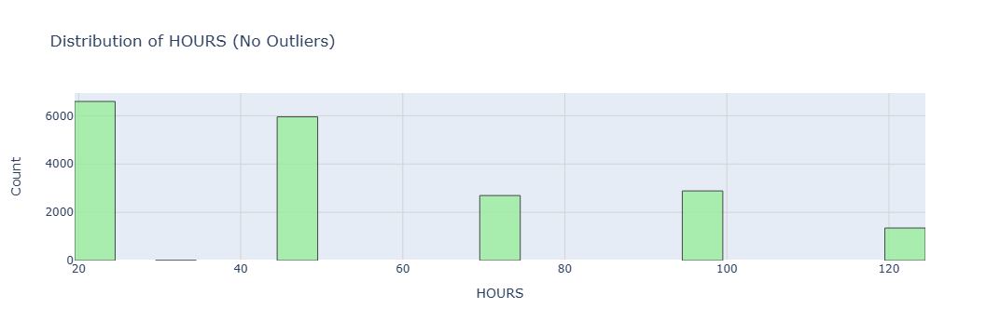

Isolation Forest was utilized for outlier detection due to its effectiveness in isolating anomalies within high-dimensional datasets. Detected outliers were then removed from the dataset to enhance data reliability, ensuring a more robust foundation for subsequent statistical analyses and modeling tasks.


In [44]:
from sklearn.ensemble import IsolationForest
import plotly.express as px

# Assuming df is your DataFrame with numerical columns AGE and HOURS
data = df[['AGE', 'HOURS']]

# Initialize Isolation Forest model
clf = IsolationForest(random_state=0, contamination='auto')

# Fit model and predict outliers
outliers = clf.fit_predict(data)

# Identify indices of outliers
outlier_indices = data.index[outliers == -1]

# Optionally, remove outliers from your DataFrame
df_no_outliers = df.drop(outlier_indices)

# Print number of outliers detected
num_outliers = len(outlier_indices)
print(f"Number of outliers detected: {num_outliers}")

# Visualize remaining data after outlier removal
fig_age_hist_no_outliers = px.histogram(df_no_outliers, x='AGE', title='Distribution of AGE (No Outliers)')
fig_age_hist_no_outliers.update_traces(marker_color='skyblue', marker_line_color='black', marker_line_width=1, opacity=0.7)
fig_age_hist_no_outliers.update_layout(title_text='Distribution of AGE (No Outliers)', xaxis_title='AGE', yaxis_title='Count',
                                       xaxis_showgrid=True, yaxis_showgrid=True, 
                                       xaxis_gridwidth=1, yaxis_gridwidth=1, 
                                       xaxis_gridcolor='lightgray', yaxis_gridcolor='lightgray')

fig_hours_hist_no_outliers = px.histogram(df_no_outliers, x='HOURS', title='Distribution of HOURS (No Outliers)')
fig_hours_hist_no_outliers.update_traces(marker_color='lightgreen', marker_line_color='black', marker_line_width=1, opacity=0.7)
fig_hours_hist_no_outliers.update_layout(title_text='Distribution of HOURS (No Outliers)', xaxis_title='HOURS', yaxis_title='Count',
                                         xaxis_showgrid=True, yaxis_showgrid=True, 
                                         xaxis_gridwidth=1, yaxis_gridwidth=1, 
                                         xaxis_gridcolor='lightgray', yaxis_gridcolor='lightgray')

# Display histograms and explanation
fig_age_hist_no_outliers.show()
fig_hours_hist_no_outliers.show()

# Explanation of Isolation Forest
print("Isolation Forest was utilized for outlier detection due to its effectiveness in isolating anomalies within high-dimensional datasets. Detected outliers were then removed from the dataset to enhance data reliability, ensuring a more robust foundation for subsequent statistical analyses and modeling tasks.")


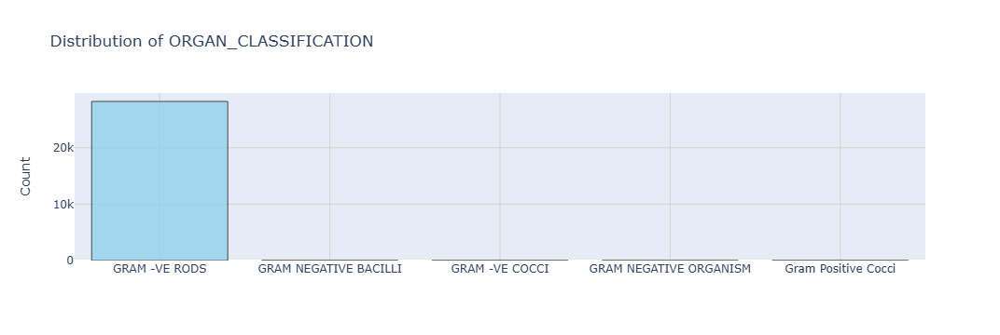

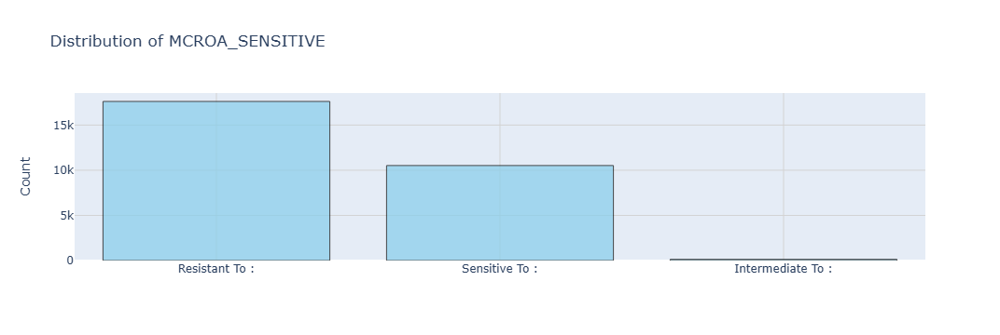

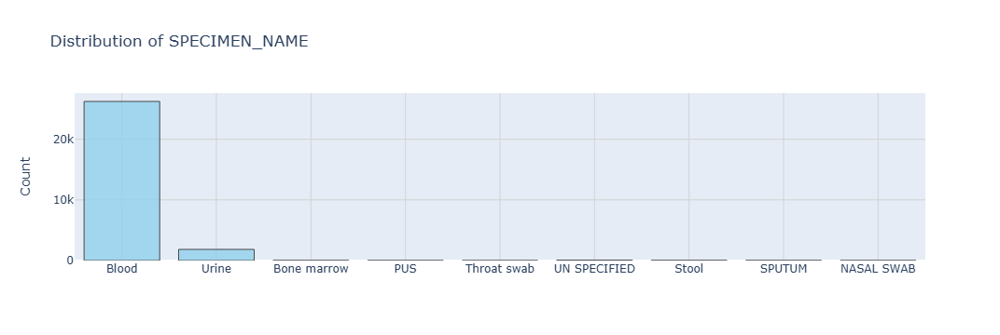

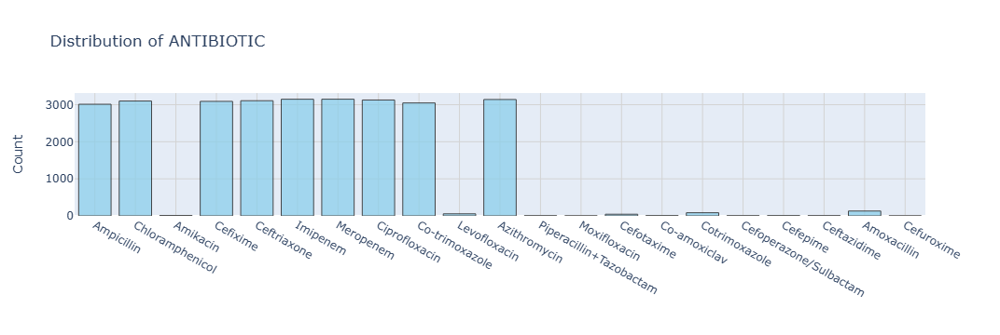

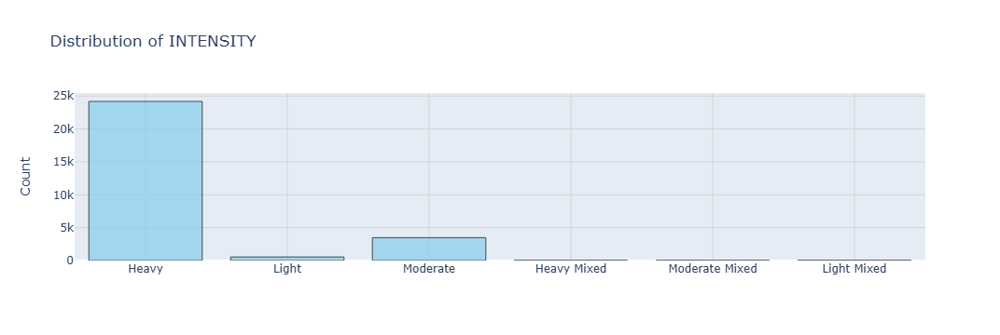

In [47]:
import plotly.express as px

# Create histograms for multiple categorical variables
fig_organ_classification = px.histogram(df, x='ORGAN_CLASSIFICATION', title='Distribution of ORGAN_CLASSIFICATION')
fig_mcroa_sensitive = px.histogram(df, x='MCROA_SENSITIVE', title='Distribution of MCROA_SENSITIVE')
fig_specimen_name = px.histogram(df, x='SPECIMEN_NAME', title='Distribution of SPECIMEN_NAME')
fig_antibiotic = px.histogram(df, x='ANTIBIOTIC', title='Distribution of ANTIBIOTIC')
fig_intensity = px.histogram(df, x='INTENSITY', title='Distribution of INTENSITY')

# Customize layout for all histograms
for fig in [fig_organ_classification, fig_mcroa_sensitive, fig_specimen_name, fig_antibiotic, fig_intensity]:
    fig.update_traces(marker_color='skyblue', marker_line_color='black', marker_line_width=1, opacity=0.7)
    fig.update_layout(xaxis_title=fig.data[0].name, yaxis_title='Count', 
                      xaxis_showgrid=True, yaxis_showgrid=True, 
                      xaxis_gridwidth=1, yaxis_gridwidth=1, 
                      xaxis_gridcolor='lightgray', yaxis_gridcolor='lightgray')

# Show all histograms
fig_organ_classification.show()
fig_mcroa_sensitive.show()
fig_specimen_name.show()
fig_antibiotic.show()
fig_intensity.show()


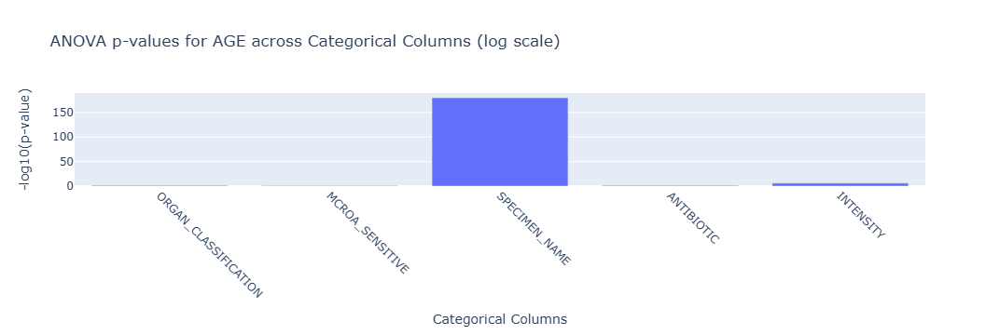


Summary for AGE across ORGAN_CLASSIFICATION:
Mean AGE: [12.481804260749353, 11.0, 9.5, 6.0, 7.0]
Median AGE: [9.0, 11.0, 9.5, 6.0, 7.0]
Std Dev AGE: [11.126822256413815, 0.0, 6.688444820557844, 0.0, 0.0]
ANOVA p-value: 0.0585

Summary for AGE across MCROA_SENSITIVE:
Mean AGE: [12.448356980703744, 12.491839003991638, 14.25]
Median AGE: [9.0, 9.0, 10.0]
Std Dev AGE: [11.106842413768021, 11.110800987990768, 12.673536148941167]
ANOVA p-value: 0.1660

Summary for AGE across SPECIMEN_NAME:
Mean AGE: [12.040339280268375, 17.125, 13.666666666666666, 21.5, 15.0, 25.5, 20.5, 36.73076923076923, 52.5]
Median AGE: [9.0, 12.0, 10.0, 21.5, 15.0, 22.5, 22.5, 35.0, 52.5]
Std Dev AGE: [10.618137925512839, 14.715523388670256, 9.127304766889967, 8.74642784226795, 0.0, 18.75190131205104, 7.538472751729718, 2.42582262018792, 13.891385396543216]
ANOVA p-value: 0.0000

Summary for AGE across ANTIBIOTIC:
Mean AGE: [12.545488047808766, 12.531035818005808, 10.181818181818182, 12.495284789644012, 12.525268747988

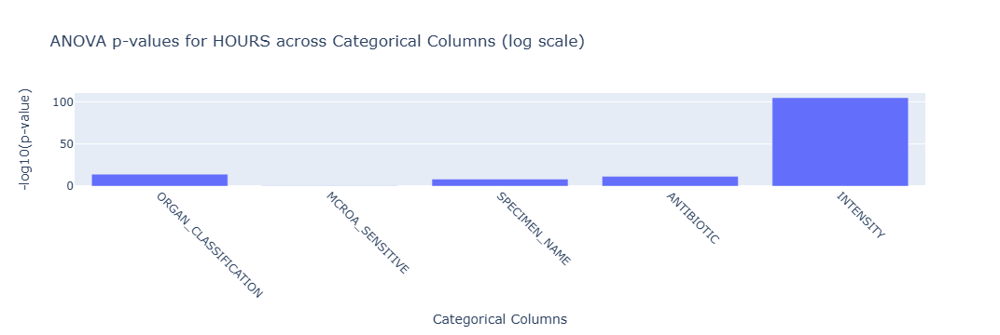


Summary for HOURS across ORGAN_CLASSIFICATION:
Mean HOURS: [67.68700152422814, 48.0, 36.0, 168.0, 48.0]
Median HOURS: [48.0, 48.0, 36.0, 168.0, 48.0]
Std Dev HOURS: [41.44947006555357, 0.0, 12.347898130260637, 0.0, 0.0]
ANOVA p-value: 0.0000

Summary for HOURS across MCROA_SENSITIVE:
Mean HOURS: [67.73359818388195, 67.5071279224482, 72.22058823529412]
Median HOURS: [48.0, 48.0, 48.0]
Std Dev HOURS: [41.311746460160954, 41.66414701866301, 43.62511868628162]
ANOVA p-value: 0.3980

Summary for HOURS across SPECIMEN_NAME:
Mean HOURS: [67.32799634034767, 71.42282608695652, 56.0, 96.0, 48.0, 72.0, 96.0, 84.92307692307692, 84.0]
Median HOURS: [48.0, 48.0, 48.0, 96.0, 48.0, 48.0, 84.0, 72.0, 84.0]
Std Dev HOURS: [41.20806296697138, 44.380669785703915, 30.50346764650764, 0.0, 0.0, 38.21363225526782, 51.6338759232458, 60.040601647167456, 37.04369439078191]
ANOVA p-value: 0.0000

Summary for HOURS across ANTIBIOTIC:
Mean HOURS: [66.48605577689243, 67.19651500484026, 80.72727272727273, 67.1980582

In [48]:
#### Relation ship between numerics and catagorcal varible 
import pandas as pd
import numpy as np
import plotly.express as px
from scipy.stats import f_oneway



# Example ANOVA for AGE across each categorical column
anova_results_age = []
summary_age = {}
for cat_col in df.select_dtypes(include='object').columns:
    if cat_col != 'REPORT_DATE' and cat_col != 'BIRTH_DATE':
        groups_age = [df['AGE'][df[cat_col] == cat] for cat in df[cat_col].unique()]
        anova_age = f_oneway(*groups_age)
        anova_results_age.append((cat_col, anova_age.pvalue))
        summary_age[cat_col] = {
            'Mean AGE': [grp.mean() for grp in groups_age],
            'Median AGE': [np.median(grp) for grp in groups_age],
            'Std Dev AGE': [grp.std() for grp in groups_age],
            'ANOVA p-value': anova_age.pvalue
        }

# Example ANOVA for HOURS across each categorical column
anova_results_hours = []
summary_hours = {}
for cat_col in df.select_dtypes(include='object').columns:
    if cat_col != 'REPORT_DATE' and cat_col != 'BIRTH_DATE':
        groups_hours = [df['HOURS'][df[cat_col] == cat] for cat in df[cat_col].unique()]
        anova_hours = f_oneway(*groups_hours)
        anova_results_hours.append((cat_col, anova_hours.pvalue))
        summary_hours[cat_col] = {
            'Mean HOURS': [grp.mean() for grp in groups_hours],
            'Median HOURS': [np.median(grp) for grp in groups_hours],
            'Std Dev HOURS': [grp.std() for grp in groups_hours],
            'ANOVA p-value': anova_hours.pvalue
        }

# Visualize ANOVA results for AGE
fig_age_anova = px.bar(x=[res[0] for res in anova_results_age], y=[-np.log10(res[1]) for res in anova_results_age],
                       labels={'x': 'Categorical Columns', 'y': '-log10(p-value)'},
                       title='ANOVA p-values for AGE across Categorical Columns (log scale)')
fig_age_anova.update_xaxes(tickangle=45)
fig_age_anova.show()

# Display summary for AGE relationships including p-value
for col, summary in summary_age.items():
    print(f"\nSummary for AGE across {col}:")
    for stat, values in summary.items():
        if stat == 'ANOVA p-value':
            print(f"ANOVA p-value: {values:.4f}")
        else:
            print(f"{stat}: {values}")

# Visualize ANOVA results for HOURS
fig_hours_anova = px.bar(x=[res[0] for res in anova_results_hours], y=[-np.log10(res[1]) for res in anova_results_hours],
                         labels={'x': 'Categorical Columns', 'y': '-log10(p-value)'},
                         title='ANOVA p-values for HOURS across Categorical Columns (log scale)')
fig_hours_anova.update_xaxes(tickangle=45)
fig_hours_anova.show()

# Display summary for HOURS relationships including p-value
for col, summary in summary_hours.items():
    print(f"\nSummary for HOURS across {col}:")
    for stat, values in summary.items():
        if stat == 'ANOVA p-value':
            print(f"ANOVA p-value: {values:.4f}")
        else:
            print(f"{stat}: {values}")


In [276]:
# Print column names to verify
print(df.columns)

Index(['AGE', 'BIRTH_DATE', 'HOURS', 'ORGAN_CLASSIFICATION', 'REPORT_DATE',
       'MCROA_SENSITIVE', 'SPECIMEN_NAME', 'ANTIBIOTIC', 'INTENSITY',
       'outlier'],
      dtype='object')


In [49]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error



# Print column names to verify
print(df.columns)

# Select predictors and target variable
X = df[['HOURS']]  # Ensure 'HOURS' matches the exact column name
y = df['AGE']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and fit the model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
print(f"R-squared: {r2:.4f}")
print(f"Mean Squared Error: {mse:.4f}")

# Coefficients and intercept
print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)

"""Regression Analysis Summary:

Model: Linear Regression
Target Variable: AGE
Predictor Variable: HOURS
R-squared: 0.0001 (indicating that the model explains very little of the variance in AGE)
Mean Squared Error: 118.0026 (average squared difference between predicted and actual AGE values)
Coefficients: HOURS coefficient is 0.0030, suggesting a minimal positive relationship with AGE.
Intercept: 12.28, the estimated AGE when HOURS is zero."""

Index(['AGE', 'BIRTH_DATE', 'HOURS', 'ORGAN_CLASSIFICATION', 'REPORT_DATE',
       'MCROA_SENSITIVE', 'SPECIMEN_NAME', 'ANTIBIOTIC', 'INTENSITY',
       'outlier'],
      dtype='object')
R-squared: 0.0001
Mean Squared Error: 118.0026
Coefficients: [0.00301048]
Intercept: 12.277876197091297


'Regression Analysis Summary:\n\nModel: Linear Regression\nTarget Variable: AGE\nPredictor Variable: HOURS\nR-squared: 0.0001 (indicating that the model explains very little of the variance in AGE)\nMean Squared Error: 118.0026 (average squared difference between predicted and actual AGE values)\nCoefficients: HOURS coefficient is 0.0030, suggesting a minimal positive relationship with AGE.\nIntercept: 12.28, the estimated AGE when HOURS is zero.'

In [50]:
# Assuming df is your DataFrame containing the dataset
unique_values = df['ANTIBIOTIC'].unique()
print("Unique values in MCROA_SENSITIVE column:")
print(unique_values)


Unique values in MCROA_SENSITIVE column:
['Ampicillin' 'Chloramphenicol' 'Amikacin' 'Cefixime' 'Ceftriaxone'
 'Imipenem' 'Meropenem' 'Ciprofloxacin' 'Co-trimoxazole' 'Levofloxacin'
 'Azithromycin' 'Piperacillin+Tazobactam' 'Moxifloxacin' 'Cefotaxime'
 'Co-amoxiclav' 'Cotrimoxazole' 'Cefoperazone/Sulbactam' 'Cefepime'
 'Ceftazidime' 'Amoxacillin' 'Cefuroxime']


In [51]:
unique_values = df['MCROA_SENSITIVE'].unique()
print("Unique values in MCROA_SENSITIVE column:")
print(unique_values)


Unique values in MCROA_SENSITIVE column:
['Resistant To :' 'Sensitive To :' 'Intermediate To :']


In [52]:
unique_values = df['AGE'].unique()
print("Unique values in MCROA_SENSITIVE column:")
print(unique_values)


Unique values in MCROA_SENSITIVE column:
[ 1.   10.    0.92 11.   12.   13.   14.   15.   16.   17.   18.   19.
  2.   20.   21.   22.   23.   24.   25.   26.   27.   28.   29.    0.25
  3.   30.   31.   32.   33.   34.   35.   36.   37.   38.   39.    0.33
  4.   40.   41.   42.   43.   45.   46.   48.   49.    5.   50.   51.
 52.   53.   55.   56.   57.   58.   59.    0.5   6.   60.   61.   63.
 64.   65.   66.   69.    0.58  7.   70.   71.   72.   73.   75.    0.67
  8.   80.   81.    0.75  9.   98.  ]


In [53]:
# Check for missing values in AGE column
print(df['AGE'].isnull().sum())

0


In [54]:
# Assuming 'df' is your DataFrame
data_types = df.dtypes
print(data_types)

AGE                            float64
BIRTH_DATE              datetime64[ns]
HOURS                            int64
ORGAN_CLASSIFICATION            object
REPORT_DATE             datetime64[ns]
MCROA_SENSITIVE                 object
SPECIMEN_NAME                   object
ANTIBIOTIC                      object
INTENSITY                       object
outlier                          int32
dtype: object


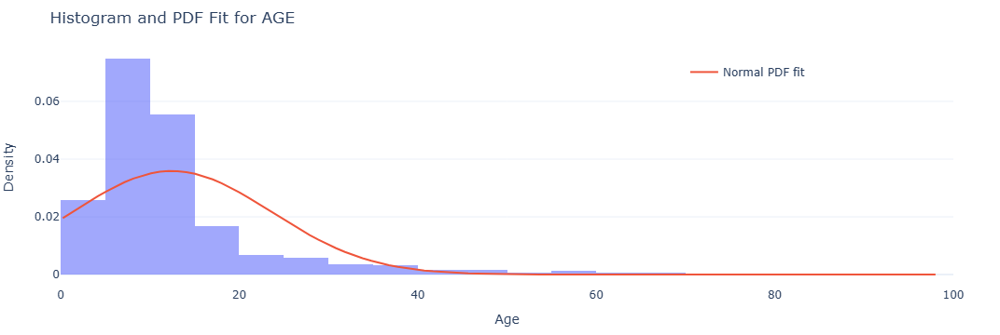

Summary Statistics for AGE (focused on probability analysis):
Mean: 12.47
Standard Deviation: 11.12


In [55]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats

# Assuming df is your DataFrame
# df = pd.read_csv('your_dataset.csv')

# Calculate summary statistics for AGE
age_summary = {
    'Mean': df['AGE'].mean(),
    'Standard Deviation': df['AGE'].std(),
}

# Fit a normal distribution to AGE
mu, std = stats.norm.fit(df['AGE'])

# Create histogram with PDF overlay
fig = px.histogram(df, x='AGE', nbins=30, title='Histogram and PDF Fit for AGE',
                   opacity=0.6, histnorm='probability density', labels={'AGE': 'Age'})
x = np.linspace(df['AGE'].min(), df['AGE'].max(), 100)
pdf = stats.norm.pdf(x, mu, std)

# Add the PDF fit to the plot
fig.add_trace(go.Scatter(x=x, y=pdf, mode='lines', name='Normal PDF fit'))

# Update layout for better presentation
fig.update_layout(
    xaxis_title="Age",
    yaxis_title="Density",
    legend=dict(x=0.7, y=0.95),
    margin=dict(l=50, r=50, t=50, b=50),  # Adjust margins as needed
    template='plotly_white'
)

fig.show()

# Print summary statistics
print("Summary Statistics for AGE (focused on probability analysis):")
for key, value in age_summary.items():
    print(f"{key}: {value:.2f}")


We conducted a probability analysis of the AGE attribute using a histogram and a fitted normal probability density function (PDF). The analysis revealed the following key statistics:

Mean Age: 12.47 years
Standard Deviation: 11.12 years
These findings indicate that the age distribution in our dataset is centered around 12.47 years with a spread of approximately 11.12 years. The histogram with the PDF overlay visually confirms that the data approximates a normal distribution, which is essential for accurate probabilistic modeling and analysis.

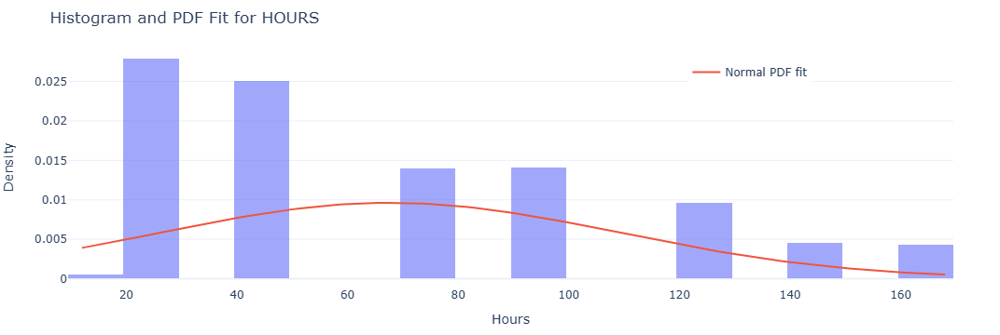

Summary Statistics for HOURS (focused on probability analysis):
Mean: 67.67
Standard Deviation: 41.45
Skewness: 0.77
Kurtosis: -0.36
Min: 12.00
25th Percentile: 24.00
Median (50th Percentile): 48.00
75th Percentile: 96.00
Max: 168.00


In [56]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from scipy import stats

# Assuming df is your DataFrame
# df = pd.read_csv('your_dataset.csv')

# Calculate summary statistics for HOURS
hours_summary = {
    'Mean': df['HOURS'].mean(),
    'Standard Deviation': df['HOURS'].std(),
    'Skewness': df['HOURS'].skew(),
    'Kurtosis': df['HOURS'].kurtosis(),
    'Min': df['HOURS'].min(),
    '25th Percentile': df['HOURS'].quantile(0.25),
    'Median (50th Percentile)': df['HOURS'].median(),
    '75th Percentile': df['HOURS'].quantile(0.75),
    'Max': df['HOURS'].max()
}

# Fit a normal distribution to HOURS
mu, std = stats.norm.fit(df['HOURS'])

# Create histogram with PDF overlay
fig = px.histogram(df, x='HOURS', nbins=30, title='Histogram and PDF Fit for HOURS',
                   opacity=0.6, histnorm='probability density', labels={'HOURS': 'Hours'})
x = np.linspace(df['HOURS'].min(), df['HOURS'].max(), 100)
pdf = stats.norm.pdf(x, mu, std)

# Add the PDF fit to the plot
fig.add_trace(go.Scatter(x=x, y=pdf, mode='lines', name='Normal PDF fit'))

# Update layout for better presentation
fig.update_layout(
    xaxis_title="Hours",
    yaxis_title="Density",
    legend=dict(x=0.7, y=0.95),
    margin=dict(l=50, r=50, t=50, b=50),  # Adjust margins as needed
    template='plotly_white'
)

fig.show()

# Print summary statistics for HOURS
print("Summary Statistics for HOURS (focused on probability analysis):")
for key, value in hours_summary.items():
    print(f"{key}: {value:.2f}")


In [57]:
print(df.columns)


Index(['AGE', 'BIRTH_DATE', 'HOURS', 'ORGAN_CLASSIFICATION', 'REPORT_DATE',
       'MCROA_SENSITIVE', 'SPECIMEN_NAME', 'ANTIBIOTIC', 'INTENSITY',
       'outlier'],
      dtype='object')


In [58]:
# Print column names to verify
print(df.columns)

# Check the first few rows of the DataFrame
print(df.head())

Index(['AGE', 'BIRTH_DATE', 'HOURS', 'ORGAN_CLASSIFICATION', 'REPORT_DATE',
       'MCROA_SENSITIVE', 'SPECIMEN_NAME', 'ANTIBIOTIC', 'INTENSITY',
       'outlier'],
      dtype='object')
   AGE BIRTH_DATE  HOURS ORGAN_CLASSIFICATION         REPORT_DATE  \
0  1.0 2022-10-03    120        GRAM -VE RODS 2022-10-26 12:14:02   
1  1.0 2022-02-03     48        GRAM -VE RODS 2023-05-06 11:30:43   
2  1.0 2022-11-08     48        GRAM -VE RODS 2023-06-12 10:25:00   
3  1.0 2022-11-12     24        GRAM -VE RODS 2023-05-19 10:27:43   
4  1.0 2021-12-22     24        GRAM -VE RODS 2022-10-03 09:55:12   

  MCROA_SENSITIVE SPECIMEN_NAME       ANTIBIOTIC INTENSITY  outlier  
0  Resistant To :         Blood       Ampicillin     Heavy       -1  
1  Resistant To :         Blood       Ampicillin     Light       -1  
2  Resistant To :         Blood       Ampicillin     Heavy       -1  
3  Resistant To :         Blood  Chloramphenicol     Heavy       -1  
4  Sensitive To :         Blood         Amikacin

In [59]:
column_names = df.columns
print(column_names)

Index(['AGE', 'BIRTH_DATE', 'HOURS', 'ORGAN_CLASSIFICATION', 'REPORT_DATE',
       'MCROA_SENSITIVE', 'SPECIMEN_NAME', 'ANTIBIOTIC', 'INTENSITY',
       'outlier'],
      dtype='object')


In [60]:
unique_ages = df['AGE'].unique()
print("Unique values in AGE column:")
print(unique_ages)


Unique values in AGE column:
[ 1.   10.    0.92 11.   12.   13.   14.   15.   16.   17.   18.   19.
  2.   20.   21.   22.   23.   24.   25.   26.   27.   28.   29.    0.25
  3.   30.   31.   32.   33.   34.   35.   36.   37.   38.   39.    0.33
  4.   40.   41.   42.   43.   45.   46.   48.   49.    5.   50.   51.
 52.   53.   55.   56.   57.   58.   59.    0.5   6.   60.   61.   63.
 64.   65.   66.   69.    0.58  7.   70.   71.   72.   73.   75.    0.67
  8.   80.   81.    0.75  9.   98.  ]


In [61]:
unique_antibiotics = df['ANTIBIOTIC'].unique()
print("Unique values in ANTIBIOTIC column:")
print(unique_antibiotics)


Unique values in ANTIBIOTIC column:
['Ampicillin' 'Chloramphenicol' 'Amikacin' 'Cefixime' 'Ceftriaxone'
 'Imipenem' 'Meropenem' 'Ciprofloxacin' 'Co-trimoxazole' 'Levofloxacin'
 'Azithromycin' 'Piperacillin+Tazobactam' 'Moxifloxacin' 'Cefotaxime'
 'Co-amoxiclav' 'Cotrimoxazole' 'Cefoperazone/Sulbactam' 'Cefepime'
 'Ceftazidime' 'Amoxacillin' 'Cefuroxime']


In [62]:
unique_microa_sensitive = df['MCROA_SENSITIVE'].unique()
print("Unique values in MCROA_SENSITIVE column:")
print(unique_microa_sensitive)


Unique values in MCROA_SENSITIVE column:
['Resistant To :' 'Sensitive To :' 'Intermediate To :']


C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_10664\3121544642.py:14: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



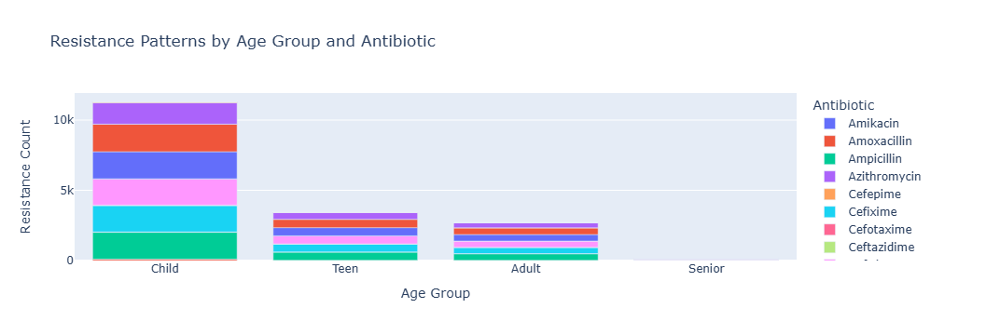

C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



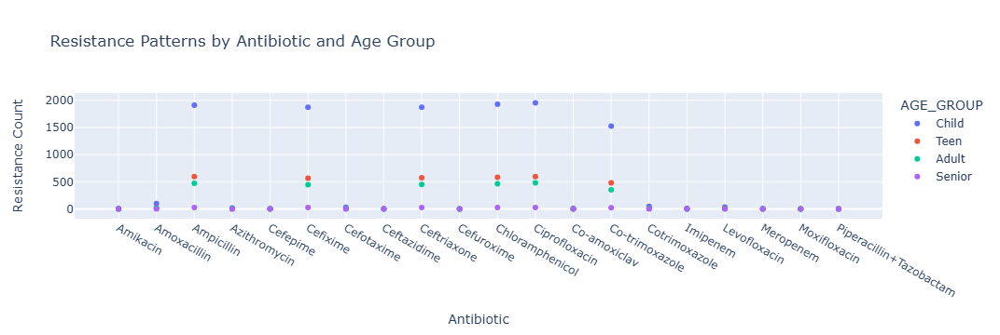

C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



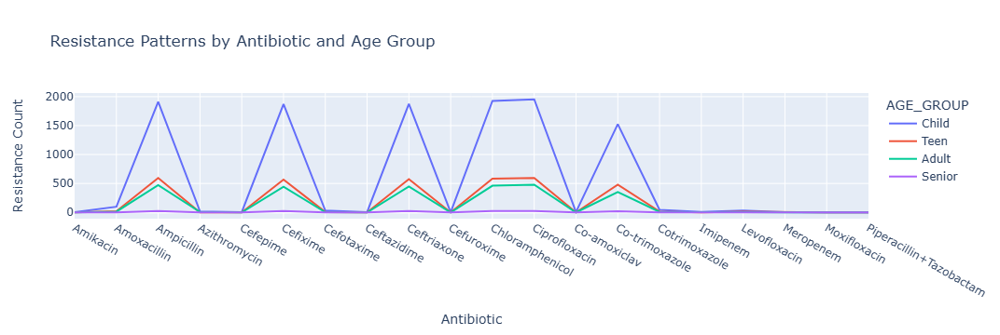

In [63]:
import pandas as pd
import plotly.express as px


# Categorize ages into 'Child', 'Adult', and 'Senior'
bins = [0, 12, 18, 65, float('inf')]
labels = ['Child', 'Teen', 'Adult', 'Senior']
df['AGE_GROUP'] = pd.cut(df['AGE'], bins=bins, labels=labels, right=False)

# Filter data for resistance patterns
resistant_data = df[df['MCROA_SENSITIVE'] == 'Resistant To :']

# Group by age group and antibiotic to count resistance occurrences
resistance_counts = resistant_data.groupby(['AGE_GROUP', 'ANTIBIOTIC']).size().reset_index(name='Resistance_Count')

# Create a grouped bar chart using Plotly Express
fig = px.bar(resistance_counts, x='AGE_GROUP', y='Resistance_Count', color='ANTIBIOTIC',
             title='Resistance Patterns by Age Group and Antibiotic',
             labels={'AGE_GROUP': 'Age Group', 'ANTIBIOTIC': 'Antibiotic', 'Resistance_Count': 'Resistance Count'})
fig.show()

fig = px.scatter(resistance_counts, x='ANTIBIOTIC', y='Resistance_Count', color='AGE_GROUP',
                 title='Resistance Patterns by Antibiotic and Age Group',
                 labels={'ANTIBIOTIC': 'Antibiotic', 'Resistance_Count': 'Resistance Count'})
fig.show()

fig = px.line(resistance_counts, x='ANTIBIOTIC', y='Resistance_Count', color='AGE_GROUP',
              title='Resistance Patterns by Antibiotic and Age Group',
              labels={'ANTIBIOTIC': 'Antibiotic', 'Resistance_Count': 'Resistance Count'})
fig.show()




In [64]:
highest_resistance_age_group = resistance_counts.groupby(['AGE_GROUP', 'ANTIBIOTIC'])['Resistance_Count'].sum().reset_index()
highest_resistance_age_group = highest_resistance_age_group.sort_values(by=['AGE_GROUP', 'Resistance_Count'], ascending=[True, False])
highest_resistance_age_group = highest_resistance_age_group.groupby('AGE_GROUP').first()

print("Highest Resistance Antibiotics by Age Group:")
print(highest_resistance_age_group)
lowest_resistance_age_group = resistance_counts.groupby(['AGE_GROUP', 'ANTIBIOTIC'])['Resistance_Count'].sum().reset_index()
lowest_resistance_age_group = lowest_resistance_age_group.sort_values(by=['AGE_GROUP', 'Resistance_Count'], ascending=[True, True])
lowest_resistance_age_group = lowest_resistance_age_group.groupby('AGE_GROUP').first()

print("Lowest Resistance Antibiotics by Age Group:")
print(lowest_resistance_age_group)




Highest Resistance Antibiotics by Age Group:
              ANTIBIOTIC  Resistance_Count
AGE_GROUP                                 
Child      Ciprofloxacin              1954
Teen          Ampicillin               595
Adult      Ciprofloxacin               478
Senior        Ampicillin                26
Lowest Resistance Antibiotics by Age Group:
           ANTIBIOTIC  Resistance_Count
AGE_GROUP                              
Child      Cefuroxime                 1
Teen         Amikacin                 0
Adult        Cefepime                 0
Senior       Amikacin                 0


C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_10664\101629924.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_10664\101629924.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_10664\101629924.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_10664\101629924.py:9: Fu

C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_10664\117141644.py:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



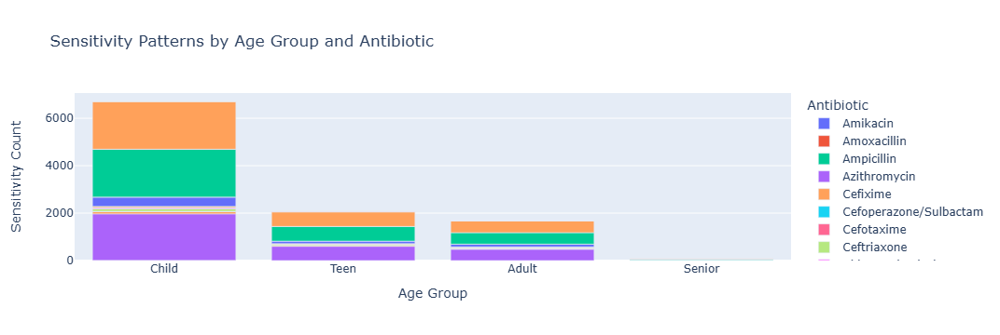

C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



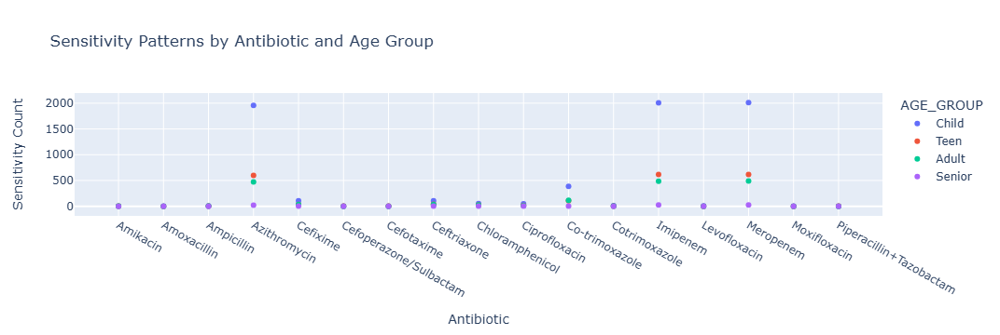

C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



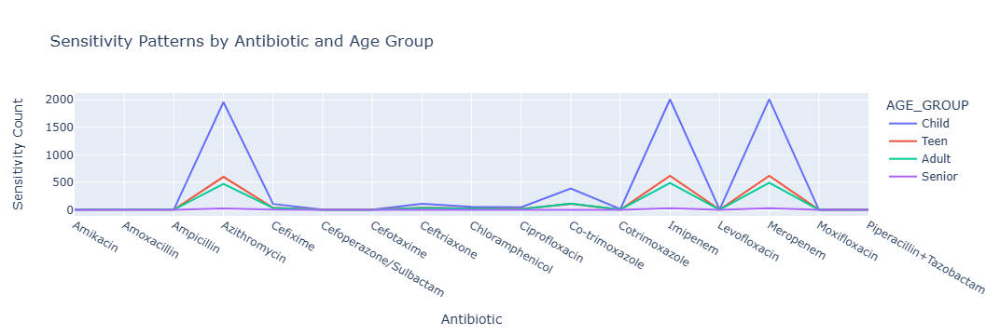

In [65]:
import pandas as pd
import plotly.express as px

# Assuming df contains your dataset with appropriate columns including 'AGE', 'MCROA_SENSITIVE', and 'ANTIBIOTIC'

# Categorize ages into 'Child', 'Teen', 'Adult', and 'Senior'
bins = [0, 12, 18, 65, float('inf')]
labels = ['Child', 'Teen', 'Adult', 'Senior']
df['AGE_GROUP'] = pd.cut(df['AGE'], bins=bins, labels=labels, right=False)

# Filter data for sensitivity patterns where MCROA_SENSITIVE is 'Sensitive To :'
sensitive_data = df[df['MCROA_SENSITIVE'] == 'Sensitive To :']

# Group by age group and antibiotic to count sensitivity occurrences
sensitivity_counts = sensitive_data.groupby(['AGE_GROUP', 'ANTIBIOTIC']).size().reset_index(name='Sensitivity_Count')

# Create a grouped bar chart using Plotly Express
fig_bar = px.bar(sensitivity_counts, x='AGE_GROUP', y='Sensitivity_Count', color='ANTIBIOTIC',
                 title='Sensitivity Patterns by Age Group and Antibiotic',
                 labels={'AGE_GROUP': 'Age Group', 'ANTIBIOTIC': 'Antibiotic', 'Sensitivity_Count': 'Sensitivity Count'})
fig_bar.show()

# Create a scatter plot
fig_scatter = px.scatter(sensitivity_counts, x='ANTIBIOTIC', y='Sensitivity_Count', color='AGE_GROUP',
                         title='Sensitivity Patterns by Antibiotic and Age Group',
                         labels={'ANTIBIOTIC': 'Antibiotic', 'Sensitivity_Count': 'Sensitivity Count'})
fig_scatter.show()

# Create a line chart
fig_line = px.line(sensitivity_counts, x='ANTIBIOTIC', y='Sensitivity_Count', color='AGE_GROUP',
                   title='Sensitivity Patterns by Antibiotic and Age Group',
                   labels={'ANTIBIOTIC': 'Antibiotic', 'Sensitivity_Count': 'Sensitivity Count'})
fig_line.show()


In [324]:
import pandas as pd

# Assuming sensitivity_counts dataframe contains sensitivity patterns data by age group and antibiotic

# Find highest sensitivity antibiotics by age group
highest_sensitivity_age_group = sensitivity_counts.groupby(['AGE_GROUP', 'ANTIBIOTIC'])['Sensitivity_Count'].sum().reset_index()
highest_sensitivity_age_group = highest_sensitivity_age_group.sort_values(by=['AGE_GROUP', 'Sensitivity_Count'], ascending=[True, False])
highest_sensitivity_age_group = highest_sensitivity_age_group.groupby('AGE_GROUP').first()

print("Highest Sensitivity Antibiotics by Age Group:")
print(highest_sensitivity_age_group)

# Find lowest sensitivity antibiotics by age group
lowest_sensitivity_age_group = sensitivity_counts.groupby(['AGE_GROUP', 'ANTIBIOTIC'])['Sensitivity_Count'].sum().reset_index()
lowest_sensitivity_age_group = lowest_sensitivity_age_group.sort_values(by=['AGE_GROUP', 'Sensitivity_Count'], ascending=[True, True])
lowest_sensitivity_age_group = lowest_sensitivity_age_group.groupby('AGE_GROUP').first()

print("Lowest Sensitivity Antibiotics by Age Group:")
print(lowest_sensitivity_age_group)


Highest Sensitivity Antibiotics by Age Group:
          ANTIBIOTIC  Sensitivity_Count
AGE_GROUP                              
Child      Meropenem               2010
Teen        Imipenem                616
Adult      Meropenem                490
Senior      Imipenem                 26
Lowest Sensitivity Antibiotics by Age Group:
            ANTIBIOTIC  Sensitivity_Count
AGE_GROUP                                
Child      Amoxacillin                  1
Teen       Amoxacillin                  0
Adult      Amoxacillin                  0
Senior        Amikacin                  0


C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_14276\4045675759.py:6: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_14276\4045675759.py:8: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_14276\4045675759.py:14: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Ubaid-khan\AppData\Local\Temp\ipykernel_14276\4045675759.py: